In [1]:
!pip install -q transformers datasets accelerate evaluate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 3.6 MB/s eta 0:00:00


In [2]:
import os
import re
import random
import time
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay
)

from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer,
    set_seed
)

In [3]:
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
set_seed(SEED)

print("GPU available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

GPU available: True
GPU: Tesla T4


In [4]:
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
set_seed(SEED)

print("GPU available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

GPU available: True
GPU: Tesla T4


In [6]:
df = pd.read_csv("Paper1_Final_BERT_RoBERTa_Dataset.csv")

df.head()

,text,label,source
0,(00-380) Trading prohibition and registration ...,0,Enron
1,RE: Phone Call You need to give me a boottle i...,0,Enron
2,Desk Password Update Click Here To keep your e...,1,Nazario_5
3,Account jose@monkey.org Email Quata Limit Mail...,1,Nazario_5
4,Re: Fort James/Wauna contract termination Ther...,0,Enron


In [7]:
print(df.shape)

print(df.columns)

print(df.isnull().sum())

print(df["label"].value_counts())


(3104, 3)
Index(['text', 'label', 'source'], dtype='object')
text      0
label     0
source    0
dtype: int64
label
0    1552
1    1552
Name: count, dtype: int64


In [8]:
df["text_length"] = df["text"].apply(len)

df["text_length"].describe()

,text_length
count,3.104000e+03
mean,3.178102e+03
std,8.372558e+04
min,1.000000e+00
25%,3.587500e+02
50%,7.300000e+02
75%,1.394000e+03
max,4.549430e+06


In [9]:
X_train, X_test, y_train, y_test = train_test_split(
    df["text"],
    df["label"],
    test_size=0.20,
    random_state=42,
    stratify=df["label"]
)

print("Training samples:", len(X_train))
print("Testing samples:", len(X_test))

Training samples: 2483
Testing samples: 621


In [10]:
!pip install -q transformers datasets accelerate evaluate

In [11]:
import torch

from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    Trainer,
    TrainingArguments
)

In [12]:
bert_tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [13]:
train_encodings = bert_tokenizer(
    X_train.tolist(),
    truncation=True,
    padding=True,
    max_length=256
)

test_encodings = bert_tokenizer(
    X_test.tolist(),
    truncation=True,
    padding=True,
    max_length=256
)

In [14]:
print(train_encodings.keys())

KeysView({'input_ids': [[101, 1056, 2860, 6178, 18908, 28008, 7047, 1041, 2497, 12740, 22275, 2050, 8094, 4443, 1024, 6098, 6412, 1024, 1056, 2860, 6178, 18908, 28008, 7047, 1041, 2497, 12740, 22275, 2050, 3058, 1024, 1018, 1013, 2539, 1013, 2541, 2051, 1024, 1023, 1024, 4002, 2572, 1011, 2184, 1024, 4002, 2572, 1006, 2430, 3115, 2051, 1007, 19072, 1024, 17680, 9230, 2136, 6851, 6412, 1024, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 10608, 10

In [15]:
class EmailDataset(torch.utils.data.Dataset):

    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels.tolist()

    def __getitem__(self, idx):

        item = {
            key: torch.tensor(val[idx])
            for key, val in self.encodings.items()
        }

        item["labels"] = torch.tensor(self.labels[idx])

        return item

    def __len__(self):
        return len(self.labels)

In [16]:
train_dataset = EmailDataset(train_encodings, y_train)

test_dataset = EmailDataset(test_encodings, y_test)

In [17]:
print(len(train_dataset))
print(len(test_dataset))

2483
621


In [18]:
bert_model = AutoModelForSequenceClassification.from_pretrained(
    "bert-base-uncased",
    num_labels=2
)

model.safetensors: reconstructing file:   0%|          |  0.00B /  440MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

[transformers] BertForSequenceClassification LOAD REPORT from: bert-base-uncased
Key                                        | Status     | 
-------------------------------------------+------------+-
cls.predictions.transform.LayerNorm.weight | UNEXPECTED | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED | 
cls.predictions.transform.dense.weight     | UNEXPECTED | 
cls.predictions.bias                       | UNEXPECTED | 
cls.seq_relationship.bias                  | UNEXPECTED | 
cls.predictions.transform.dense.bias       | UNEXPECTED | 
cls.seq_relationship.weight                | UNEXPECTED | 
classifier.weight                          | MISSING    | 
classifier.bias                            | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


In [19]:
print(df.shape)

print(df.columns)

print(df.isnull().sum())

print(df["label"].value_counts())

(3104, 4)
Index(['text', 'label', 'source', 'text_length'], dtype='object')
text           0
label          0
source         0
text_length    0
dtype: int64
label
0    1552
1    1552
Name: count, dtype: int64


In [20]:
df["text_length"] = df["text"].apply(len)

df["text_length"].describe()

,text_length
count,3.104000e+03
mean,3.178102e+03
std,8.372558e+04
min,1.000000e+00
25%,3.587500e+02
50%,7.300000e+02
75%,1.394000e+03
max,4.549430e+06


In [21]:
X_train, X_test, y_train, y_test = train_test_split(
    df["text"],
    df["label"],
    test_size=0.20,
    random_state=42,
    stratify=df["label"]
)

print("Training samples:", len(X_train))
print("Testing samples:", len(X_test))

Training samples: 2483
Testing samples: 621


In [22]:
!pip install -q transformers datasets accelerate evaluate

In [23]:
import torch

from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    Trainer,
    TrainingArguments
)

In [24]:
bert_tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")

In [25]:
train_encodings = bert_tokenizer(
    X_train.tolist(),
    truncation=True,
    padding=True,
    max_length=256
)

test_encodings = bert_tokenizer(
    X_test.tolist(),
    truncation=True,
    padding=True,
    max_length=256
)

In [26]:
print(train_encodings.keys())

KeysView({'input_ids': [[101, 1056, 2860, 6178, 18908, 28008, 7047, 1041, 2497, 12740, 22275, 2050, 8094, 4443, 1024, 6098, 6412, 1024, 1056, 2860, 6178, 18908, 28008, 7047, 1041, 2497, 12740, 22275, 2050, 3058, 1024, 1018, 1013, 2539, 1013, 2541, 2051, 1024, 1023, 1024, 4002, 2572, 1011, 2184, 1024, 4002, 2572, 1006, 2430, 3115, 2051, 1007, 19072, 1024, 17680, 9230, 2136, 6851, 6412, 1024, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 10608, 10

In [27]:
class EmailDataset(torch.utils.data.Dataset):

    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels.tolist()

    def __getitem__(self, idx):

        item = {
            key: torch.tensor(val[idx])
            for key, val in self.encodings.items()
        }

        item["labels"] = torch.tensor(self.labels[idx])

        return item

    def __len__(self):
        return len(self.labels)

In [28]:
train_dataset = EmailDataset(train_encodings, y_train)

test_dataset = EmailDataset(test_encodings, y_test)

In [29]:
print(len(train_dataset))
print(len(test_dataset))

2483
621


In [30]:
bert_model = AutoModelForSequenceClassification.from_pretrained(
    "bert-base-uncased",
    num_labels=2
)

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

[transformers] BertForSequenceClassification LOAD REPORT from: bert-base-uncased
Key                                        | Status     | 
-------------------------------------------+------------+-
cls.predictions.transform.LayerNorm.weight | UNEXPECTED | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED | 
cls.predictions.transform.dense.weight     | UNEXPECTED | 
cls.predictions.bias                       | UNEXPECTED | 
cls.seq_relationship.bias                  | UNEXPECTED | 
cls.predictions.transform.dense.bias       | UNEXPECTED | 
cls.seq_relationship.weight                | UNEXPECTED | 
classifier.weight                          | MISSING    | 
classifier.bias                            | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


In [31]:
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay
)

In [32]:
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)

    return {
        "accuracy": accuracy_score(labels, predictions),
        "precision": precision_score(
            labels,
            predictions,
            zero_division=0
        ),
        "recall": recall_score(
            labels,
            predictions,
            zero_division=0
        ),
        "f1": f1_score(
            labels,
            predictions,
            zero_division=0
        )
    }

In [33]:
bert_training_args = TrainingArguments(
    output_dir="./bert_results",
    learning_rate=2e-5,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    num_train_epochs=3,
    weight_decay=0.01,
    warmup_ratio=0.10,
    max_grad_norm=1.0,
    eval_strategy="epoch",
    save_strategy="epoch",
    logging_strategy="steps",
    logging_steps=50,
    load_best_model_at_end=True,
    metric_for_best_model="recall",
    greater_is_better=True,
    report_to="none",
    seed=42
)

[transformers] warmup_ratio is deprecated and will be removed in v5.2. Use `warmup_steps` instead.


In [34]:
bert_trainer = Trainer(
    model=bert_model,
    args=bert_training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    compute_metrics=compute_metrics
)

In [35]:
import torch

print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")

True
Tesla T4


In [36]:
import torch

print(torch.cuda.is_available())
print(torch.cuda.device_count())

if torch.cuda.is_available():
    print(torch.cuda.get_device_name(0))

True
1
Tesla T4


In [37]:
!nvidia-smi

Fri Jul 17 14:42:48 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   37C    P0             25W /   70W |     577MiB /  15360MiB |     18%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [38]:
bert_trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.053705,0.054218,0.985507,0.996700,0.974194,0.985318
2,0.008940,0.034100,0.990338,0.990323,0.990323,0.990323
3,0.005119,0.036573,0.988728,0.990291,0.987097,0.988691


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

[transformers] There were missing keys in the checkpoint model loaded: ['bert.embeddings.LayerNorm.weight', 'bert.embeddings.LayerNorm.bias', 'bert.encoder.layer.0.attention.output.LayerNorm.weight', 'bert.encoder.layer.0.attention.output.LayerNorm.bias', 'bert.encoder.layer.0.output.LayerNorm.weight', 'bert.encoder.layer.0.output.LayerNorm.bias', 'bert.encoder.layer.1.attention.output.LayerNorm.weight', 'bert.encoder.layer.1.attention.output.LayerNorm.bias', 'bert.encoder.layer.1.output.LayerNorm.weight', 'bert.encoder.layer.1.output.LayerNorm.bias', 'bert.encoder.layer.2.attention.output.LayerNorm.weight', 'bert.encoder.layer.2.attention.output.LayerNorm.bias', 'bert.encoder.layer.2.output.LayerNorm.weight', 'bert.encoder.layer.2.output.LayerNorm.bias', 'bert.encoder.layer.3.attention.output.LayerNorm.weight', 'bert.encoder.layer.3.attention.output.LayerNorm.bias', 'bert.encoder.layer.3.output.LayerNorm.weight', 'bert.encoder.layer.3.output.LayerNorm.bias', 'bert.encoder.layer.4.atte

TrainOutput(global_step=468, training_loss=0.08561262421500988, metrics={'train_runtime': 470.1595, 'train_samples_per_second': 15.844, 'train_steps_per_second': 0.995, 'total_flos': 979957125688320.0, 'train_loss': 0.08561262421500988, 'epoch': 3.0})

In [39]:
bert_results = bert_trainer.evaluate()
bert_results

Training Loss,Validation Loss,Epoch,Accuracy,Precision,Recall,F1
0.005119,0.034113,3,0.990338,0.990323,0.990323,0.990323


{'eval_loss': 0.034112922847270966,
 'eval_accuracy': 0.9903381642512077,
 'eval_precision': 0.9903225806451613,
 'eval_recall': 0.9903225806451613,
 'eval_f1': 0.9903225806451613}

In [40]:
bert_prediction_output = bert_trainer.predict(test_dataset)

bert_y_pred = np.argmax(
    bert_prediction_output.predictions,
    axis=1
)

In [41]:
print(
    classification_report(
        y_test,
        bert_y_pred,
        target_names=["Legitimate", "Phishing"]
    )
)

              precision    recall  f1-score   support

  Legitimate       0.99      0.99      0.99       311
    Phishing       0.99      0.99      0.99       310

    accuracy                           0.99       621
   macro avg       0.99      0.99      0.99       621
weighted avg       0.99      0.99      0.99       621



In [42]:
bert_cm = confusion_matrix(
    y_test,
    bert_y_pred
)

print(bert_cm)

[[308   3]
 [  3 307]]


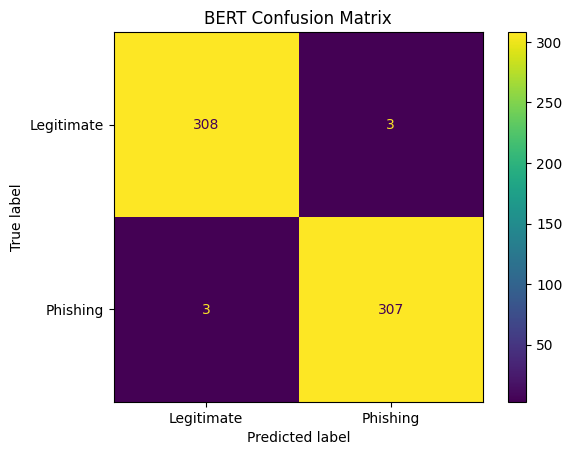

In [43]:
ConfusionMatrixDisplay(
    confusion_matrix=bert_cm,
    display_labels=["Legitimate", "Phishing"]
).plot(values_format="d")

plt.title("BERT Confusion Matrix")
plt.show()

In [44]:
bert_results_df = pd.DataFrame([{
    "Model": "BERT",
    "Accuracy": bert_results["eval_accuracy"],
    "Precision": bert_results["eval_precision"],
    "Recall": bert_results["eval_recall"],
    "F1-score": bert_results["eval_f1"]
}])

bert_results_df

,Model,Accuracy,Precision,Recall,F1-score
0,BERT,0.990338,0.990323,0.990323,0.990323


In [45]:
bert_trainer.save_model("./saved_bert_model")
bert_tokenizer.save_pretrained("./saved_bert_model")

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

('./saved_bert_model/tokenizer_config.json',
 './saved_bert_model/tokenizer.json')

In [46]:
roberta_tokenizer = AutoTokenizer.from_pretrained(
    "roberta-base"
)

config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

In [47]:
roberta_train_encodings = roberta_tokenizer(
    X_train.tolist(),
    truncation=True,
    padding=True,
    max_length=256
)

roberta_test_encodings = roberta_tokenizer(
    X_test.tolist(),
    truncation=True,
    padding=True,
    max_length=256
)


In [48]:
roberta_train_dataset = EmailDataset(
    roberta_train_encodings,
    y_train
)

roberta_test_dataset = EmailDataset(
    roberta_test_encodings,
    y_test
)

print(len(roberta_train_dataset))
print(len(roberta_test_dataset))

2483
621


In [49]:
roberta_model = AutoModelForSequenceClassification.from_pretrained(
    "roberta-base",
    num_labels=2
)

model.safetensors: reconstructing file:   0%|          |  0.00B /  499MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

[transformers] RobertaForSequenceClassification LOAD REPORT from: roberta-base
Key                        | Status     | 
---------------------------+------------+-
lm_head.bias               | UNEXPECTED | 
lm_head.layer_norm.bias    | UNEXPECTED | 
lm_head.dense.weight       | UNEXPECTED | 
lm_head.dense.bias         | UNEXPECTED | 
lm_head.layer_norm.weight  | UNEXPECTED | 
classifier.dense.weight    | MISSING    | 
classifier.out_proj.bias   | MISSING    | 
classifier.out_proj.weight | MISSING    | 
classifier.dense.bias      | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


In [50]:
roberta_training_args = TrainingArguments(
    output_dir="./roberta_results",
    learning_rate=2e-5,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    num_train_epochs=3,
    weight_decay=0.01,
    warmup_ratio=0.10,
    max_grad_norm=1.0,
    eval_strategy="epoch",
    save_strategy="epoch",
    logging_strategy="steps",
    logging_steps=50,
    load_best_model_at_end=True,
    metric_for_best_model="recall",
    greater_is_better=True,
    report_to="none",
    seed=42
)

[transformers] warmup_ratio is deprecated and will be removed in v5.2. Use `warmup_steps` instead.


In [51]:
per_device_train_batch_size=8,
gradient_accumulation_steps=2,

In [52]:
roberta_trainer = Trainer(
    model=roberta_model,
    args=roberta_training_args,
    train_dataset=roberta_train_dataset,
    eval_dataset=roberta_test_dataset,
    compute_metrics=compute_metrics
)

In [53]:
roberta_trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.062706,0.097583,0.980676,0.996667,0.964516,0.980328
2,0.015904,0.041177,0.990338,0.984076,0.996774,0.990385
3,0.019251,0.047166,0.988728,0.993485,0.983871,0.988655


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

TrainOutput(global_step=468, training_loss=0.09545196707233086, metrics={'train_runtime': 628.6203, 'train_samples_per_second': 11.85, 'train_steps_per_second': 0.744, 'total_flos': 979957125688320.0, 'train_loss': 0.09545196707233086, 'epoch': 3.0})

In [54]:
roberta_results = roberta_trainer.evaluate()
roberta_results

Training Loss,Validation Loss,Epoch,Accuracy,Precision,Recall,F1
0.019251,0.041177,3,0.990338,0.984076,0.996774,0.990385


{'eval_loss': 0.04117747023701668,
 'eval_accuracy': 0.9903381642512077,
 'eval_precision': 0.9840764331210191,
 'eval_recall': 0.9967741935483871,
 'eval_f1': 0.9903846153846154}

In [55]:
roberta_prediction_output = roberta_trainer.predict(
    roberta_test_dataset
)

roberta_y_pred = np.argmax(
    roberta_prediction_output.predictions,
    axis=1
)

In [56]:
print(
    classification_report(
        y_test,
        roberta_y_pred,
        target_names=["Legitimate", "Phishing"]
    )
)

              precision    recall  f1-score   support

  Legitimate       1.00      0.98      0.99       311
    Phishing       0.98      1.00      0.99       310

    accuracy                           0.99       621
   macro avg       0.99      0.99      0.99       621
weighted avg       0.99      0.99      0.99       621



In [57]:
roberta_cm = confusion_matrix(
    y_test,
    roberta_y_pred
)

print(roberta_cm)

[[306   5]
 [  1 309]]


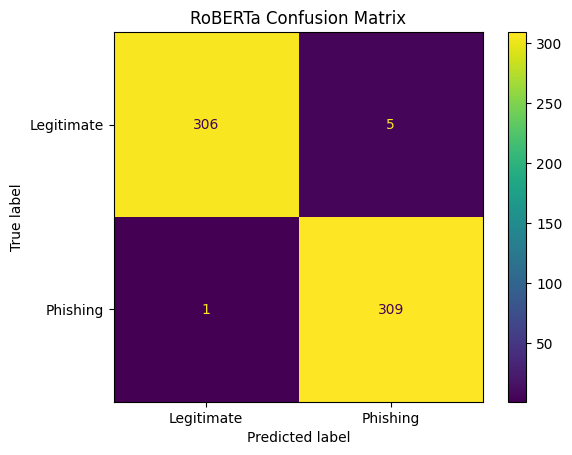

In [58]:
ConfusionMatrixDisplay(
    confusion_matrix=roberta_cm,
    display_labels=["Legitimate", "Phishing"]
).plot(values_format="d")

plt.title("RoBERTa Confusion Matrix")
plt.show()

In [59]:
comparison = pd.DataFrame({
    "Model": ["BERT", "RoBERTa"],
    "Accuracy": [
        bert_results["eval_accuracy"],
        roberta_results["eval_accuracy"]
    ],
    "Precision": [
        bert_results["eval_precision"],
        roberta_results["eval_precision"]
    ],
    "Recall": [
        bert_results["eval_recall"],
        roberta_results["eval_recall"]
    ],
    "F1-score": [
        bert_results["eval_f1"],
        roberta_results["eval_f1"]
    ]
})

comparison

,Model,Accuracy,Precision,Recall,F1-score
0,BERT,0.990338,0.990323,0.990323,0.990323
1,RoBERTa,0.990338,0.984076,0.996774,0.990385


In [60]:
comparison.to_csv(
    "paper1_bert_roberta_comparison.csv",
    index=False
)

In [61]:
roberta_trainer.save_model("./saved_roberta_model")
roberta_tokenizer.save_pretrained("./saved_roberta_model")

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

('./saved_roberta_model/tokenizer_config.json',
 './saved_roberta_model/tokenizer.json')

In [63]:
from google.colab import files

files.download(
    "paper1_bert_roberta_comparison.csv"
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>